# Pipeline zpracování obrazu
Podpůrný materiál k přednášce 10 - Morfologie a tvarové charakteristiky.

<img src='images/lentilky_promo.jpg' style="width:50%">
<p style="text-align: center;">Ilustrační obrázek špatně nasnímaného objektu. :-)</p>

### Import knihoven a konfigurace

In [1]:
%run ../../tutorials/files/svz.ipynb

---

Načtení dat

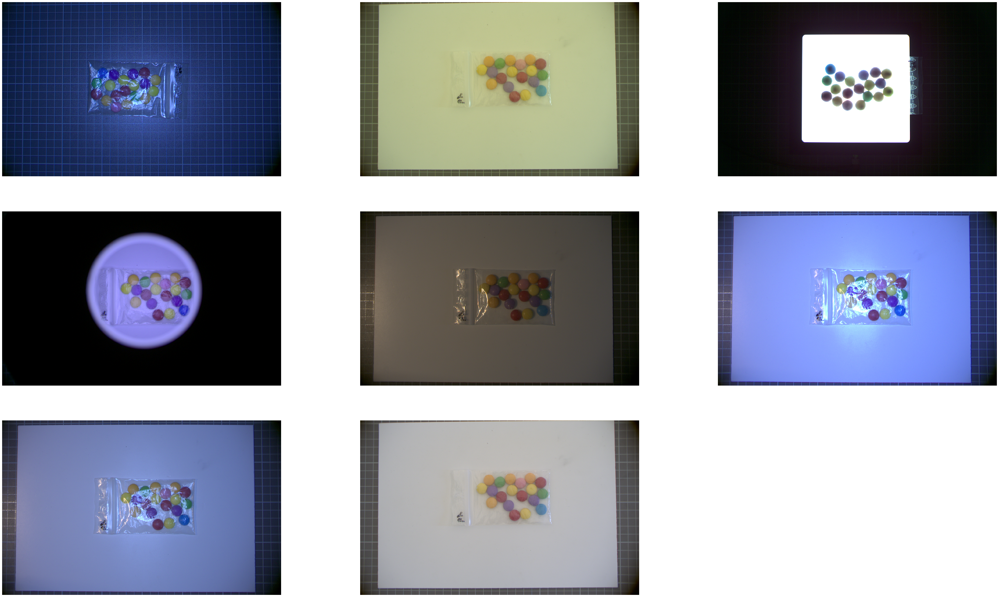

In [2]:
path = "./data_online/"

ims = []
for _, _, files in os.walk(path):
    for file in files:
        if 'lentilky' in file:
            ims.append(load_image(os.path.join(path, file)))
            
plot_images(*ims)

Výběr a crop

In [3]:
im = ims[5]
im = crop(im, 122, 43, 1728, 1168)

Segmentace

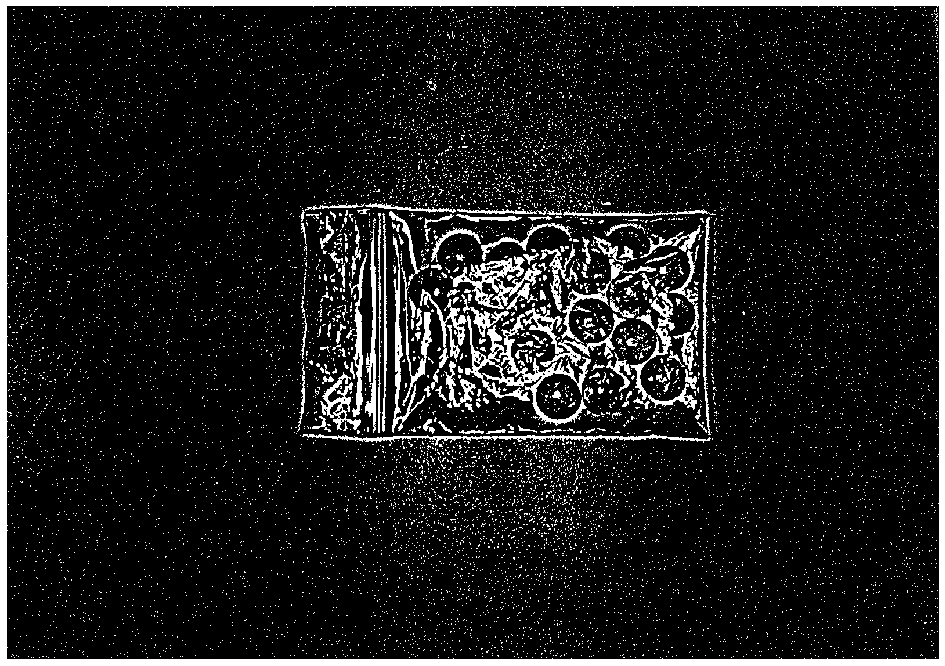

In [4]:
im_g = to_gray(im)
im_s = segmentation_adaptive_threshold(im_g, 25, -2)

plot_images(im_s)

Strukturní element

In [5]:
strel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
print(strel)

# np.array()
# strel2 = [[0, 1, 0], [1, 1, 1], [0, 1, 0]]
# print(strel2)

[[0 0 1 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [0 0 1 0 0]]


Morfologie

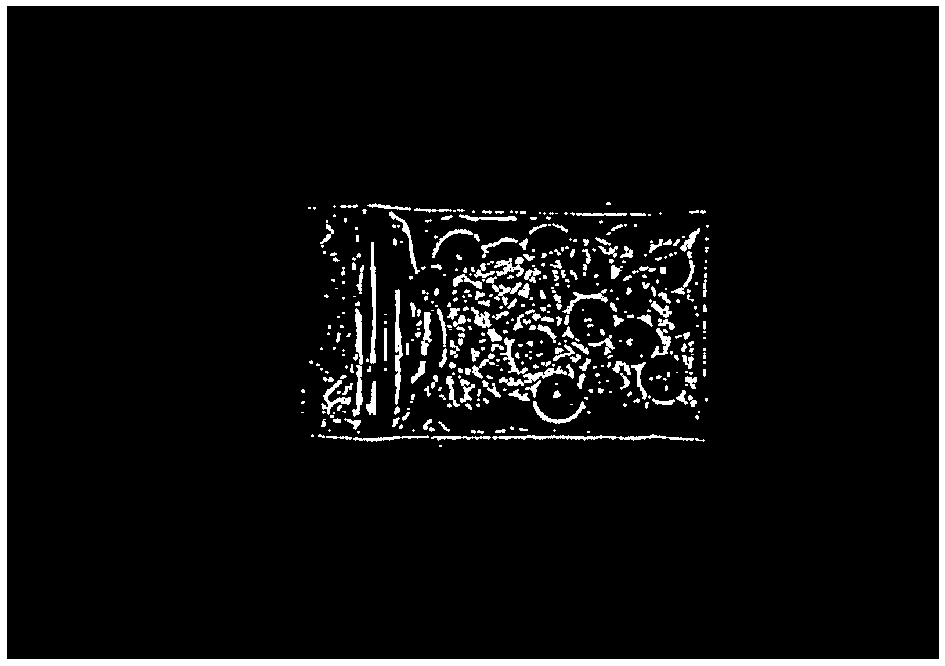

In [6]:
im_m = cv2.morphologyEx(im_s, cv2.MORPH_OPEN, strel)

plot_images(im_m)

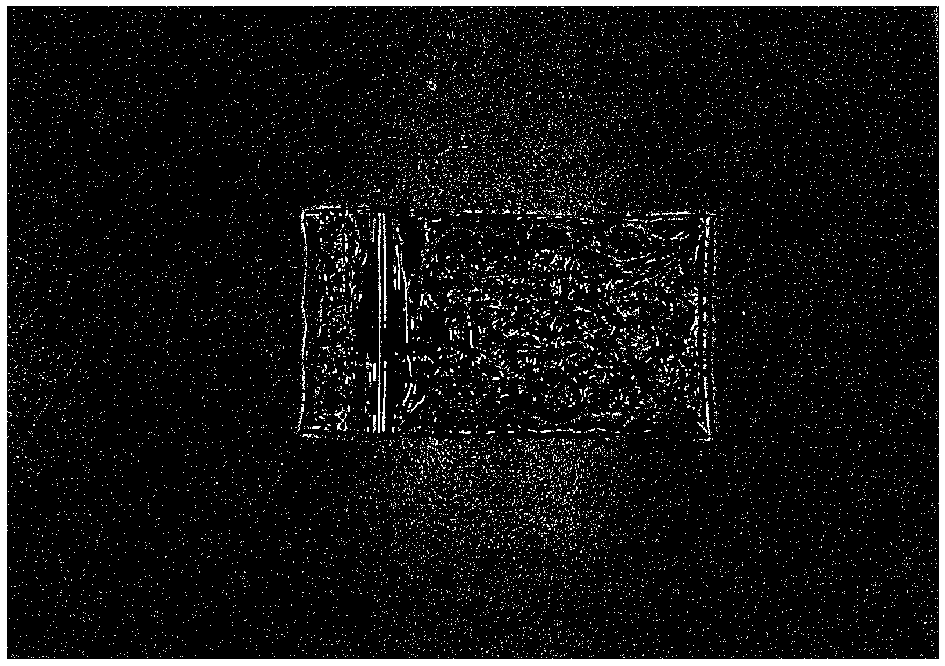

In [7]:
im_diff = cv2.subtract(im_s, im_m)
plot_images(im_diff)

Konvexní obálka

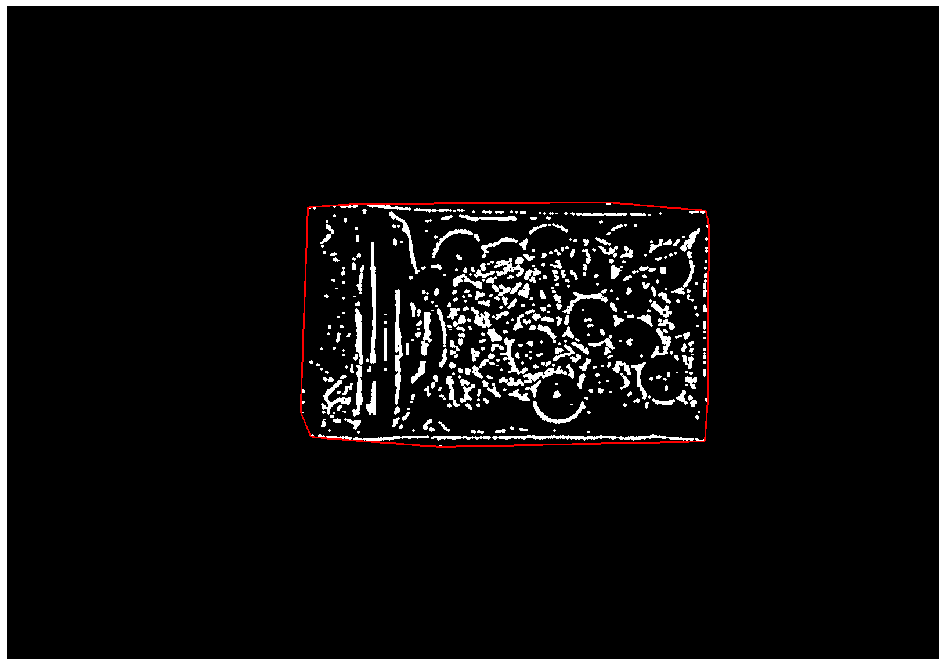

In [8]:
idx = cv2.findNonZero(im_m)

conv_hull = cv2.convexHull(idx)

im3 = to_3_channels(im_m)

cv2.drawContours(im3, [conv_hull], -1, (0,0,255), 2)


plot_images(im3)

Tvorba masky

In [9]:
print(conv_hull.shape)

print(cv2.FILLED)

(22, 1, 2)
-1


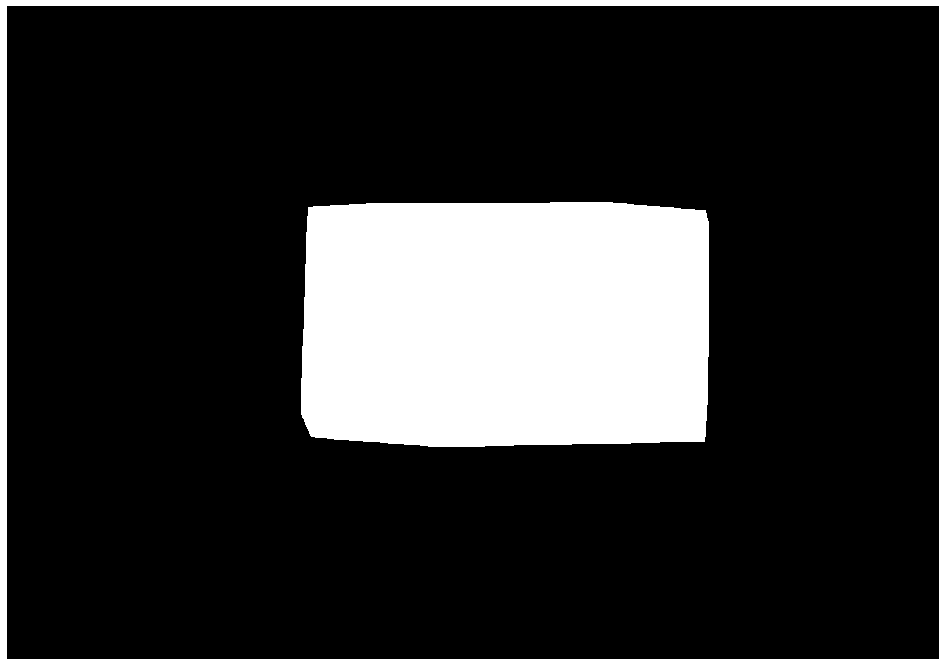

In [10]:
im_mask = np.zeros_like(im_m)

cv2.drawContours(im_mask, [conv_hull], -1, (255,255,255), cv2.FILLED)

plot_images(im_mask)

Oříznutí || maskování

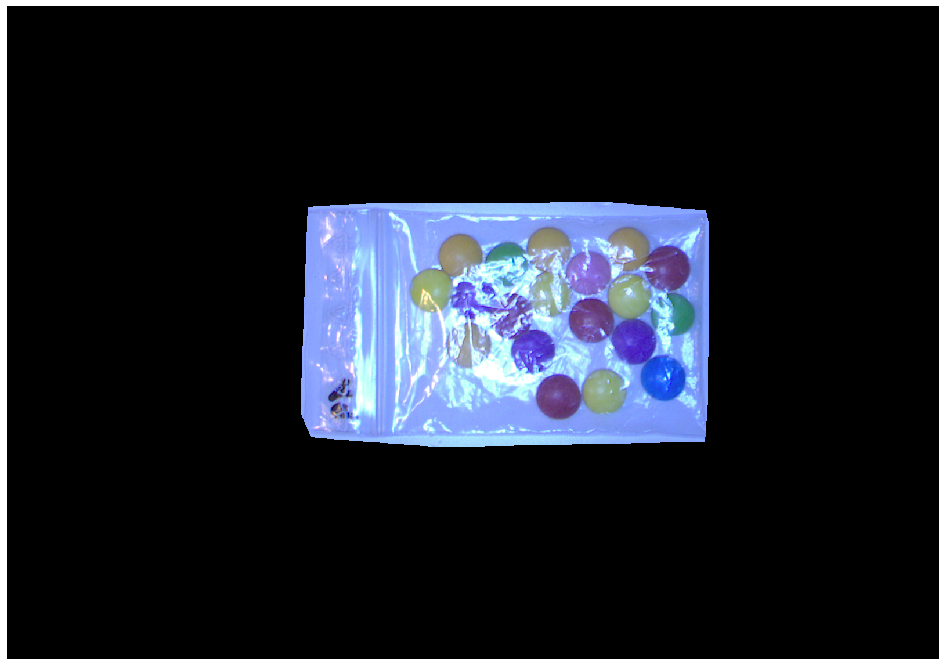

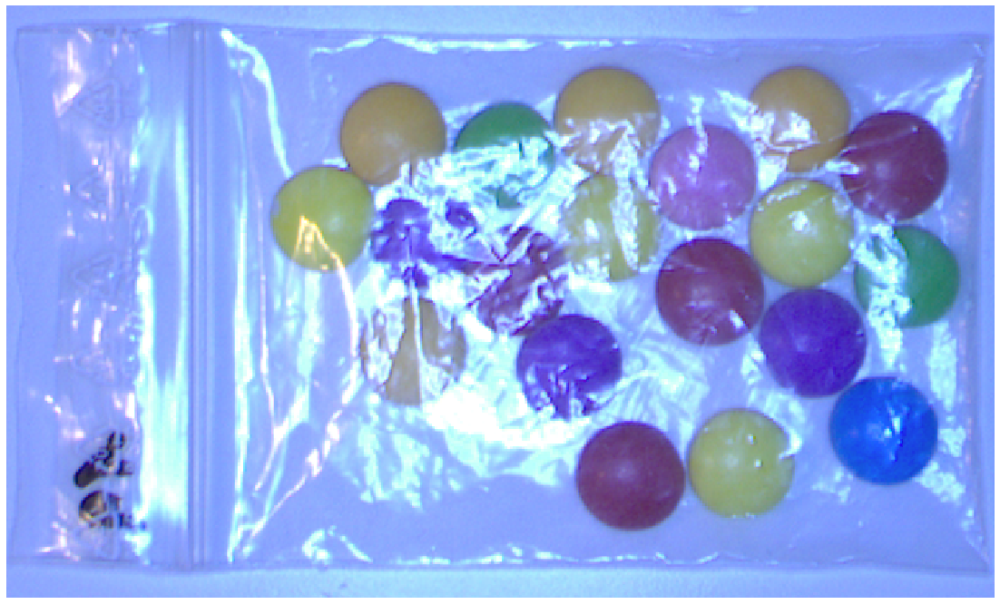

In [11]:
# 1
im_masked = apply_mask(im, im_mask)
plot_images(im_masked)

# 2
im_cropped_by_contour = crop_contour(conv_hull, im)
plot_images(im_cropped_by_contour)